In [47]:
# must use Pymc-latest environment
import xarray as xr
import numpy as np
import matplotlib.pyplot as plt
import pymc as pm
import matplotlib.cm as cm
import arviz as az
from sklearn.preprocessing import StandardScaler
import pytensor.tensor as pt
import matplotlib.cm as cm
#import regionmask
#import cartopy.crs as ccrs
from pymc_experimental.distributions.continuous import GenExtreme

(array([1., 2., 2., 3., 5., 5., 1., 2., 0., 2.]),
 array([63.70095093, 64.31347987, 64.92600881, 65.53853775, 66.15106669,
        66.76359563, 67.37612457, 67.98865351, 68.60118246, 69.2137114 ,
        69.82624034]),
 <BarContainer object of 10 artists>)

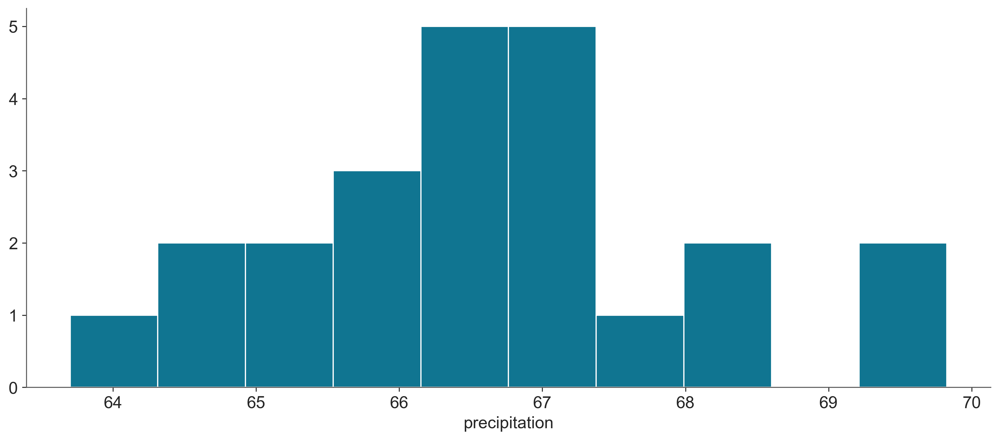

In [48]:
rawdata=xr.open_dataset("DATA/rx1day_ts_10km_area_weighted.nc").precipitation.sel(year=slice(2001,2023))

# "Normalize"
cdata=((rawdata-rawdata.mean())/rawdata.std())
rawdata.plot.hist()

0.038094077416651634


-0.4190348515831563

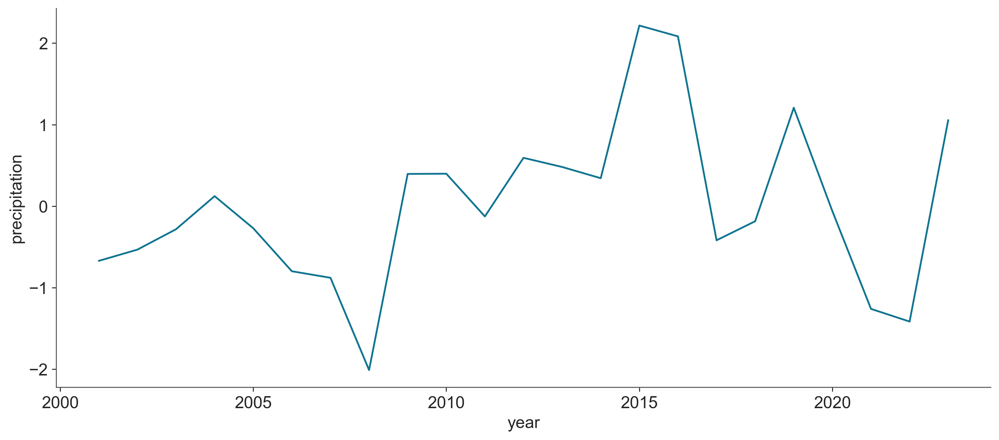

In [49]:
cdata.plot()
#t=rawdata.year
t=np.arange(len(rawdata.year))
slope,intercept=np.polyfit(t,cdata.values,1)
print(slope)
intercept

# Fit a standard GEV to the data and calculate 10,25,100 year return periods

In [50]:
# 100 year return period
ps = [1/10,1/25,1 / 100]
with pm.Model() as model:
    # Priors
    μ = pm.Normal("μ", mu=50, sigma=50)
    σ = pm.HalfNormal("σ", sigma=1)
    ξ = pm.TruncatedNormal("ξ", mu=0, sigma=0.2, lower=-0.4, upper=0.4)
    

    # Estimation
    gev = GenExtreme("gev", mu=μ, sigma=σ, xi=ξ, observed=rawdata.values)
    # Return levels
    zp={}
    for p in ps:
        zp[p] = pm.Deterministic("z_"+str(int(1/p)), μ - σ / ξ * (1 - (-np.log(1 - p)) ** (-ξ)))
       
    trace=pm.sample(target_accept=0.999)

Auto-assigning NUTS sampler...
Initializing NUTS using jitter+adapt_diag...
Multiprocess sampling (4 chains in 4 jobs)
NUTS: [μ, σ, ξ]


Output()

Sampling 4 chains for 1_000 tune and 1_000 draw iterations (4_000 + 4_000 draws total) took 3 seconds.
There were 1 divergences after tuning. Increase `target_accept` or reparameterize.


In [51]:
# 100 year return period
ps = [1/10,1/25,1 / 100]
with pm.Model() as centeredmodel:
    # Priors
    μ = pm.Normal("μ", mu=0, sigma=10)
    σ = pm.HalfNormal("σ", sigma=1)
    ξ = pm.TruncatedNormal("ξ", mu=0, sigma=0.2, lower=-0.4, upper=0.4)
    

    # Estimation
    gev = GenExtreme("gev", mu=μ, sigma=σ, xi=ξ, observed=cdata.values)
    # Return levels
    zp={}
    for p in ps:
        zp[p] = pm.Deterministic("z_"+str(int(1/p)), μ - σ / ξ * (1 - (-np.log(1 - p)) ** (-ξ)))
       
    centeredtrace=pm.sample(target_accept=0.999)

Auto-assigning NUTS sampler...
Initializing NUTS using jitter+adapt_diag...
Multiprocess sampling (4 chains in 4 jobs)
NUTS: [μ, σ, ξ]


Output()

Sampling 4 chains for 1_000 tune and 1_000 draw iterations (4_000 + 4_000 draws total) took 4 seconds.


/var/folders/l8/1gztm4113nxdtdj6k7cd03b40000gp/T/ipykernel_69529/923752949.py:2: UserWarning: The figure layout has changed to tight
  plt.tight_layout()


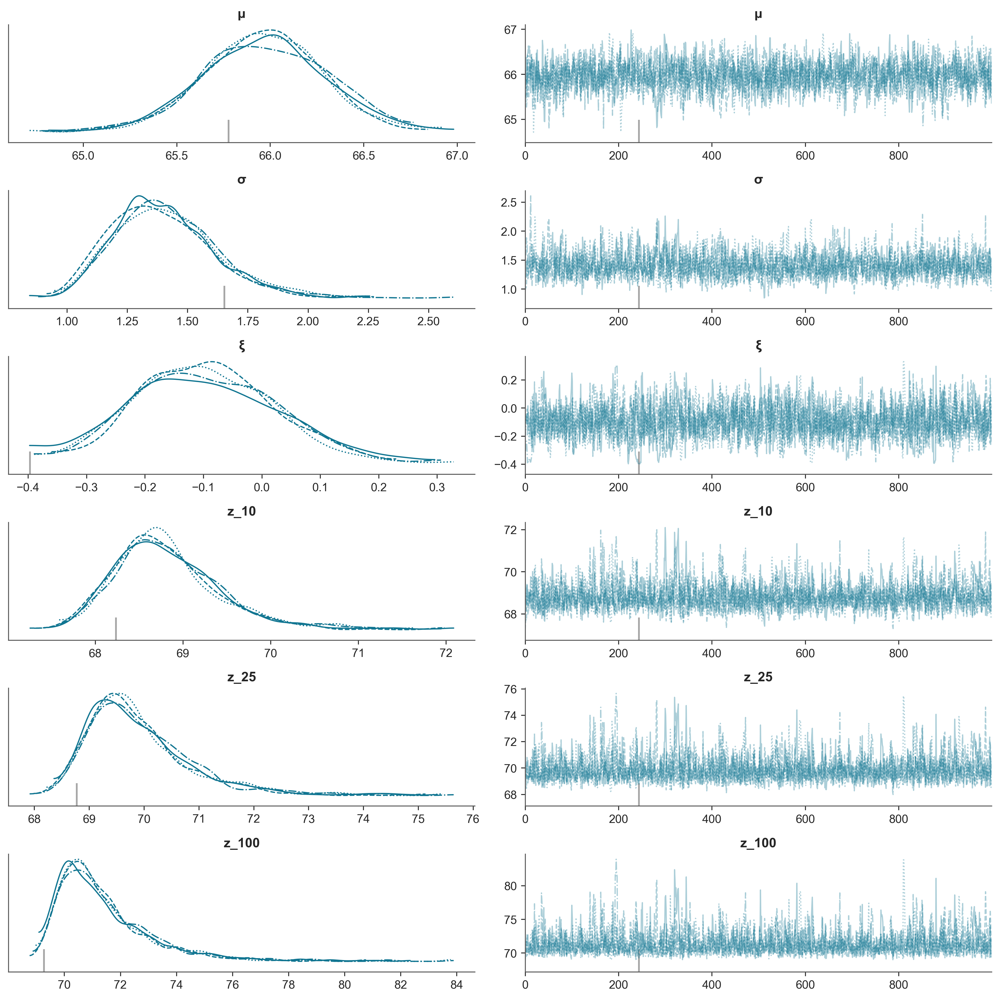

In [52]:
az.plot_trace(trace)
plt.tight_layout()

Text(0.5, 0, 'Precipitation (mm)')

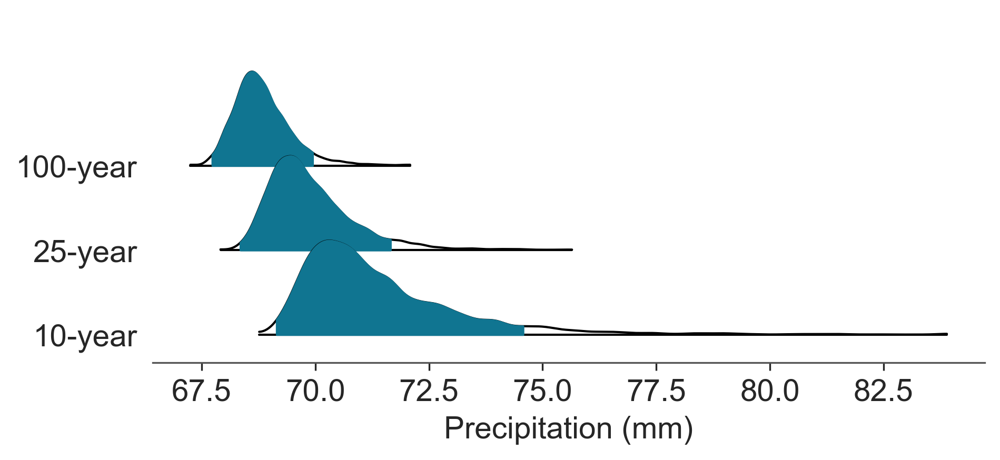

In [53]:
ax=plt.subplot(222)
axes = az.plot_forest(
    trace.posterior,
    kind="ridgeplot",
    var_names=["z_10","z_25","z_100"],
    linewidth=1,
    combined=True,
    ridgeplot_overlap=1.5,
    figsize=(11.5, 5),ridgeplot_truncate=False
,ax=ax)
#ax.set_xlim(51.5,60)
tmp=ax.set_yticklabels(["10-year","25-year", "100-year"])
ax.set_xlabel("Precipitation (mm)")

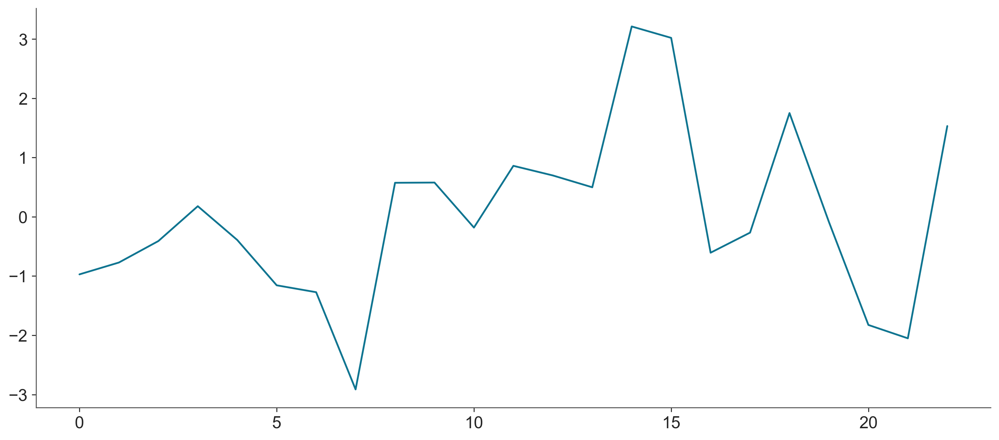

In [54]:
t=np.arange(len(rawdata.year.values))
plt.plot(t,(rawdata-rawdata.mean()))

In [55]:
# Is there evidence for a trend?
# 100 year return period
#Can I somehow reparameterize this data?
t=np.arange(len(rawdata.year.values))
poly_coefs=np.polyfit(t,rawdata.values,1)
ps = [1/10,1/100]
with pm.Model() as trendmodel:
    # Priors
    trend = pm.Normal("β1",0,1)
    intercept=pm.Normal("intercept",0,1)
    #μ = pm.Normal("μ", mu=50, sigma=1)
    μ=trend*t+intercept
    σ = pm.HalfNormal("σ", sigma=1)
    ξ = pm.TruncatedNormal("ξ", mu=0, sigma=0.2, lower=-0.5, upper=0.5)
    

    # Estimation
    gev = GenExtreme("gev", mu=μ, sigma=σ, xi=ξ, observed=(rawdata-rawdata.mean()).values)
    # Return levels
    zp={}
    for p in ps:
        zp[p] = pm.Deterministic("z_"+str(int(1/p)), μ - σ / ξ * (1 - (-np.log(1 - p)) ** (-ξ)))
    trendtrace=pm.sample(target_accept=0.999)

Auto-assigning NUTS sampler...
Initializing NUTS using jitter+adapt_diag...
Multiprocess sampling (4 chains in 4 jobs)
NUTS: [β1, intercept, σ, ξ]


Output()

Sampling 4 chains for 1_000 tune and 1_000 draw iterations (4_000 + 4_000 draws total) took 8 seconds.
There were 5 divergences after tuning. Increase `target_accept` or reparameterize.


/var/folders/l8/1gztm4113nxdtdj6k7cd03b40000gp/T/ipykernel_69529/1830312556.py:2: UserWarning: The figure layout has changed to tight
  plt.tight_layout()


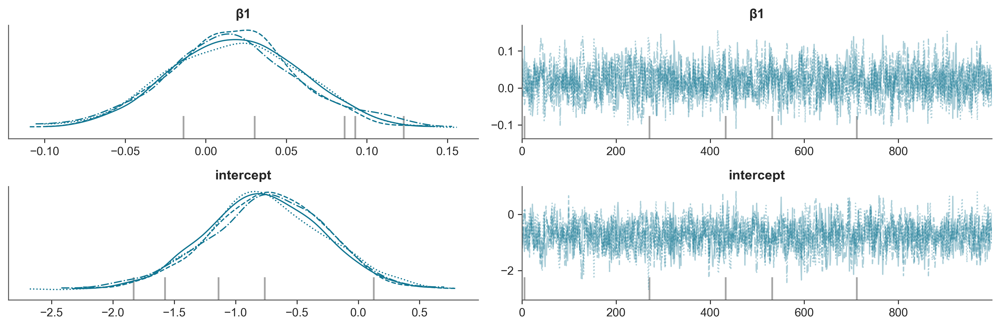

In [56]:
az.plot_trace(trendtrace,var_names=["β1","intercept"])
plt.tight_layout()

In [57]:
trendtrace.posterior["line"] = trendtrace.posterior["intercept"] + trendtrace.posterior["β1"] * xr.DataArray(t)

<Axes: >

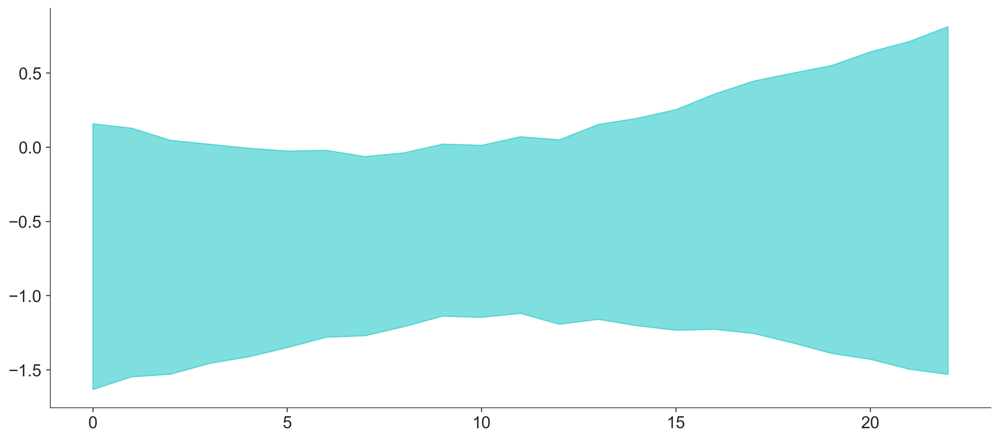

In [58]:
az.plot_hdi(t,trendtrace.posterior.line,smooth=False)

/var/folders/l8/1gztm4113nxdtdj6k7cd03b40000gp/T/ipykernel_69529/2695974597.py:26: UserWarning: The figure layout has changed to tight
  plt.tight_layout()


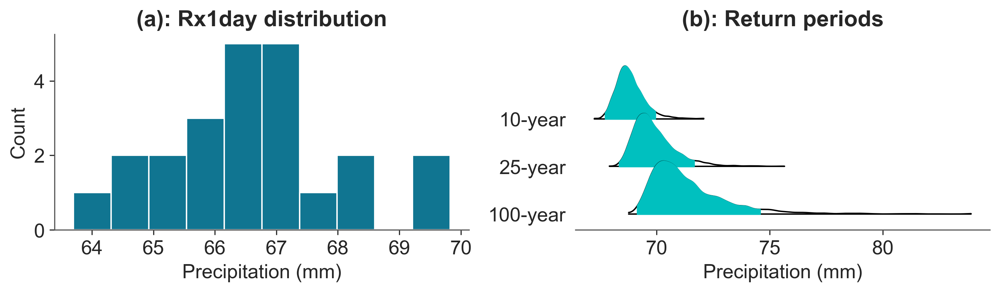

In [59]:
import seaborn as sns
sns.set_style("white")
az.style.use("arviz-doc")
plt.figure(figsize=(10,3))
ax1=plt.subplot(121)
rawdata.plot.hist(ax=ax1)
plt.ylabel("Count")
tmp=ax1.set_xlabel("Precipitation (mm)")
ax1.set_title("(a): Rx1day distribution")
ax=plt.subplot(122)

axes = az.plot_forest(
    trace.posterior,
    kind="ridgeplot",
    var_names=["z_10","z_25","z_100"],
    linewidth=1,
    combined=True,
    ridgeplot_overlap=1.5,
    figsize=(11.5, 5),ridgeplot_truncate=False
,ax=ax,colors="C1")
ax.axis("on")
#ax.set_xlim(51.5,60)
ax.set_title("(b): Return periods")
tmp=ax.set_yticklabels(["100-year","25-year", "10-year"])
tmp=ax.set_xlabel("Precipitation (mm)")
plt.tight_layout()
plt.savefig("FIGS/GEV.pdf")

In [14]:
import scipy

In [15]:
scipy.stats.linregress(t,(rawdata-rawdata.mean()).values)

LinregressResult(slope=0.055225407474545046, intercept=-0.6074794822199788, rvalue=0.252687523051569, pvalue=0.24472200098378372, stderr=0.04614429081731149, intercept_stderr=0.5927341477259277)

/var/folders/l8/1gztm4113nxdtdj6k7cd03b40000gp/T/ipykernel_69529/3747488984.py:17: UserWarning: The figure layout has changed to tight
  plt.tight_layout()


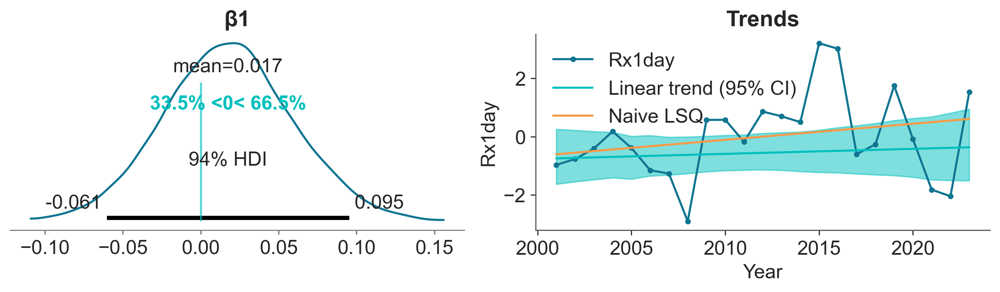

In [60]:
az.style.use("arviz-doc")
plt.figure(figsize=(10,3))
ax1=plt.subplot(121)
az.plot_posterior(trendtrace.posterior.β1,ax=ax1,ref_val=0)
plt.subplot(122)
plt.plot(t+2001,(rawdata-rawdata.mean()).values,label="Rx1day",marker="o",ms=3)
plt.plot(t+2001,float(trendtrace.posterior.β1.mean())*t+float(trendtrace.posterior.intercept.mean())\
         ,label="Linear trend (95% CI)")

p=np.polyfit(t,(rawdata-rawdata.mean()).values,1)
plt.plot(t+2001,np.polyval(p,t),label="Naive LSQ")
plt.legend()
az.plot_hdi(t+2001,trendtrace.posterior.line,smooth=False,hdi_prob=.95)
plt.ylabel("Rx1day")
plt.xlabel("Year")
plt.title("Trends")
plt.tight_layout()
plt.savefig("FIGS/GEV_trend.pdf")

/var/folders/l8/1gztm4113nxdtdj6k7cd03b40000gp/T/ipykernel_69529/923752949.py:2: UserWarning: The figure layout has changed to tight
  plt.tight_layout()


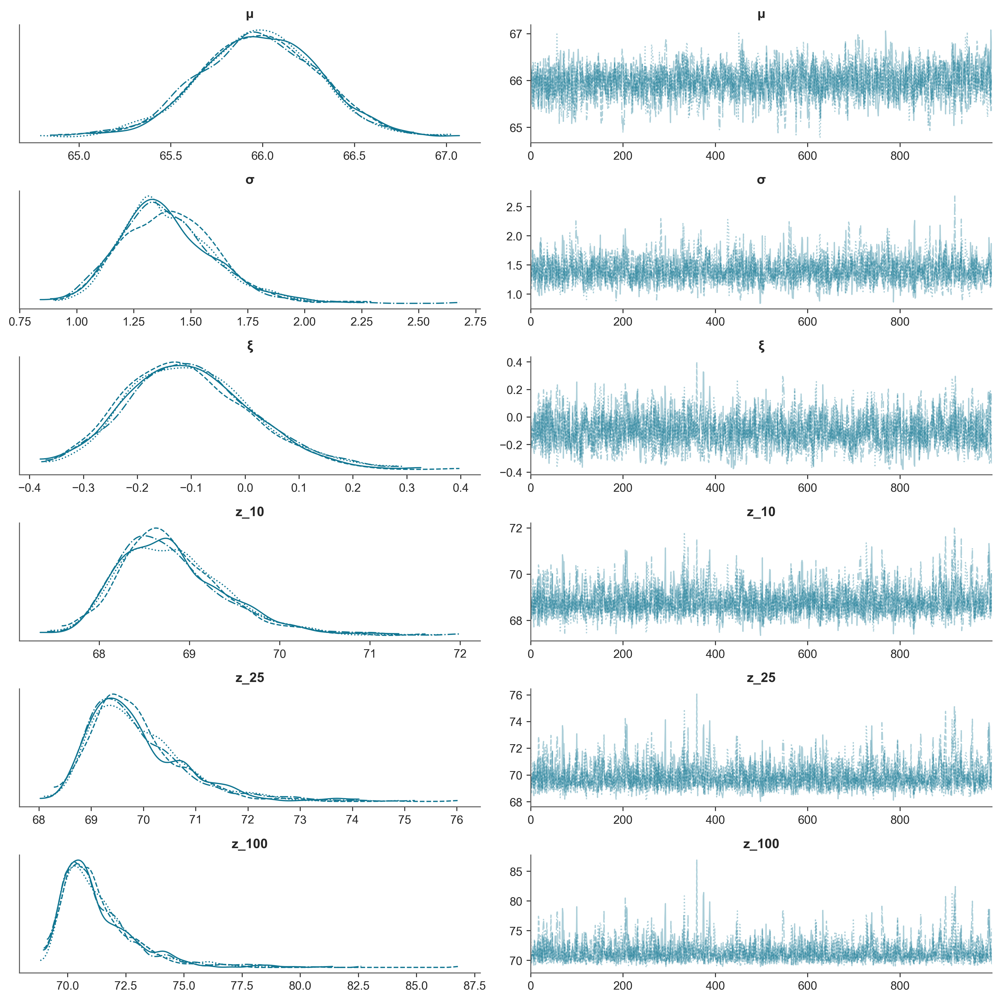

In [17]:
az.plot_trace(trace)
plt.tight_layout()

In [18]:
?rng.normal

Object `rng.normal` not found.


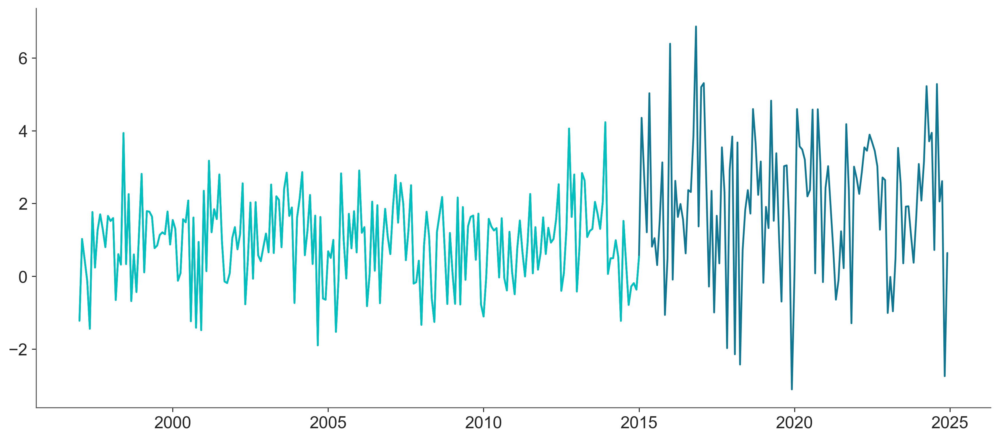

In [19]:
rng = np.random.default_rng(2025)
T=np.arange(1997,2025,1/12.)
true_changepoint=2015.

noiseless=np.zeros(len(T))

mu_1=1
sigma_1=1
mu_2=2
sigma_2=2
synthetic=np.append(rng.normal(loc=mu_1,scale=sigma_1,size=len(T[T<=true_changepoint])),\
rng.normal(loc=mu_2,scale=sigma_2,size=len(T[T>true_changepoint])))

plt.plot(T,synthetic)
plt.plot(T[T<=true_changepoint],synthetic[T<=true_changepoint])

In [20]:
Tscaled=np.arange(len(T))
with pm.Model() as changepoint_model:
    t= pm.Data('t',Tscaled)

    mu1=pm.Normal("mu_1",0,1)
    mu2=pm.Normal("mu_2",0,1)
    sd1=pm.HalfNormal("sd1",1)
    sd2=pm.HalfNormal("sd2",1)

    changepoint = pm.DiscreteUniform('changepoint', lower=Tscaled[0],upper=Tscaled[-1])

    mu_obs = pm.math.switch(t < changepoint, mu1, mu2)
    sigma_obs = pm.math.switch(t < changepoint, sd1, sd2)
    obs = pm.Normal("obs", mu=mu_obs, sigma=sigma_obs, observed=synthetic)
    cptrace=pm.sample(5000,target_accept=.99)
    cp_ll=pm.compute_log_likelihood(cptrace)

Multiprocess sampling (4 chains in 4 jobs)
CompoundStep
>NUTS: [mu_1, mu_2, sd1, sd2]
>Metropolis: [changepoint]


Output()

Sampling 4 chains for 1_000 tune and 5_000 draw iterations (4_000 + 20_000 draws total) took 6 seconds.
The rhat statistic is larger than 1.01 for some parameters. This indicates problems during sampling. See https://arxiv.org/abs/1903.08008 for details


Output()

/var/folders/l8/1gztm4113nxdtdj6k7cd03b40000gp/T/ipykernel_69529/754634612.py:26: UserWarning: The figure layout has changed to tight
  plt.tight_layout()


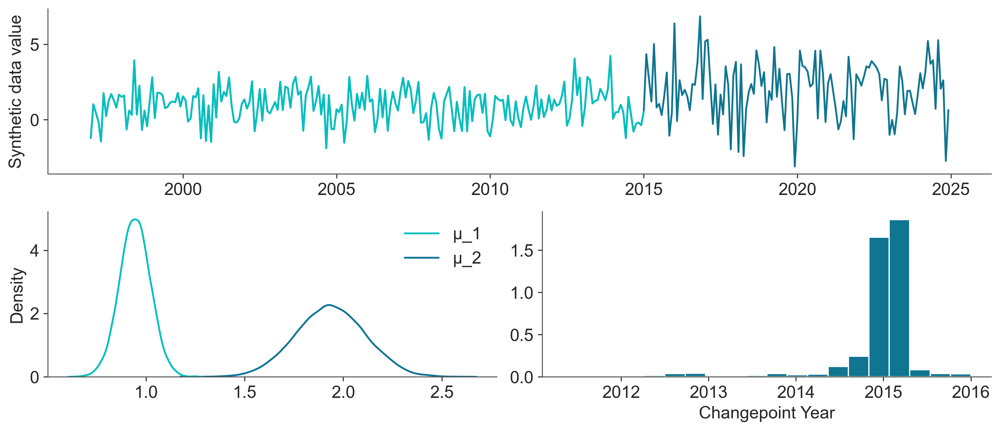

In [21]:
fig3 = plt.figure(constrained_layout=True)
gs = fig3.add_gridspec(2, 2)
f3_ax1 = fig3.add_subplot(gs[0, :])
plt.plot(T,synthetic)
plt.plot(T[T<=true_changepoint],synthetic[T<=true_changepoint])
plt.ylabel("Synthetic data value")
f3_ax2=fig3.add_subplot(gs[1, 0])

sns.kdeplot(cptrace.posterior.mu_2.values.flatten(),ax=f3_ax2,label="μ_2")
sns.kdeplot(cptrace.posterior.mu_1.values.flatten(),ax=f3_ax2,label="μ_1")

handles, labels = plt.gca().get_legend_handles_labels() 
  
# specify order 
order = [1,0] 
  
# pass handle & labels lists along with order as below 
plt.legend([handles[i] for i in order], [labels[i] for i in order]) 
#plt.show() 

f3_ax3=fig3.add_subplot(gs[1, 1])
tmp=plt.hist(T[(cptrace.posterior.changepoint.isel(draw=np.arange(5000)[1000:])).values.flatten()],20,density=True)
#plt.xlim(2014,2016)
plt.xlabel("Changepoint Year")
#plt.ylabel("Density")
plt.tight_layout()
plt.savefig("FIGS/changepoint.png")

In [22]:
Tscaled=np.arange(len(T))
with pm.Model() as no_changepoint_model:
    t= pm.Data('t',Tscaled)

    mu1=pm.Normal("mu_1",0,1)
    
    sd1=pm.HalfNormal("sd1",1)
    

   
    obs = pm.Normal("obs", mu=mu_1, sigma=sigma_1, observed=synthetic)
    nocptrace=pm.sample(5000,target_accept=.99)
    nocp_ll=pm.compute_log_likelihood(nocptrace)

Auto-assigning NUTS sampler...
Initializing NUTS using jitter+adapt_diag...
Multiprocess sampling (4 chains in 4 jobs)
NUTS: [mu_1, sd1]


Output()

Sampling 4 chains for 1_000 tune and 5_000 draw iterations (4_000 + 20_000 draws total) took 3 seconds.


Output()

In [23]:
az.compare({"Changepoint":cptrace,"No changepoint":nocptrace})

/Users/kmarvel/anaconda3/envs/Pymc-latest/lib/python3.11/site-packages/arviz/stats/stats.py:1043: RuntimeWarning: overflow encountered in exp
  weights = 1 / np.exp(len_scale - len_scale[:, None]).sum(axis=1)
/Users/kmarvel/anaconda3/envs/Pymc-latest/lib/python3.11/site-packages/arviz/stats/stats.py:795: UserWarning: Estimated shape parameter of Pareto distribution is greater than 0.70 for one or more samples. You should consider using a more robust model, this is because importance sampling is less likely to work well if the marginal posterior and LOO posterior are very different. This is more likely to happen with a non-robust model and highly influential observations.
  warnings.warn(
/Users/kmarvel/anaconda3/envs/Pymc-latest/lib/python3.11/site-packages/arviz/stats/stats.py:795: UserWarning: Estimated shape parameter of Pareto distribution is greater than 0.70 for one or more samples. You should consider using a more robust model, this is because importance sampling is less likely 

,rank,elpd_loo,p_loo,elpd_diff,weight,se,dse,warning,scale
Changepoint,0,-586.630693,7.304916,0.000000,1.000000e+00,13.992315,0.000000,True,log
No changepoint,1,-725.552979,0.000000,138.922286,4.378364e-11,37.752517,28.036366,True,log


Text(0.5, 0, 'Changepoint Year')

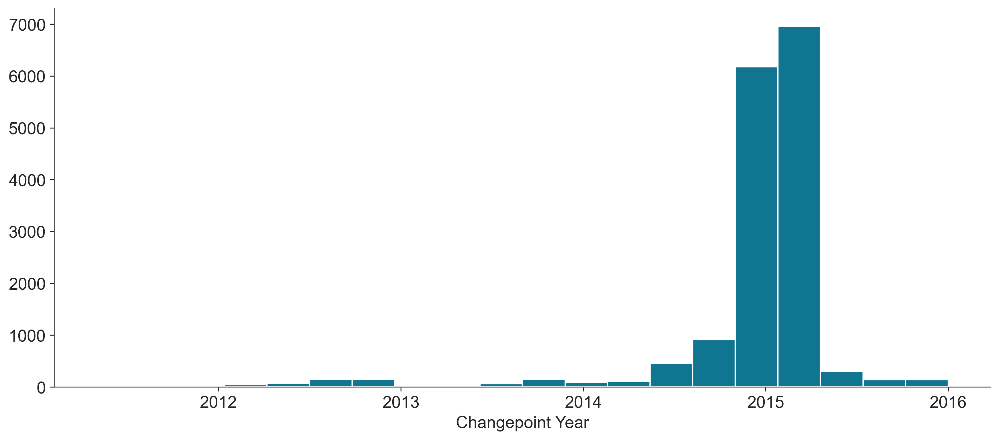

In [24]:
# changepoint detection
tmp=plt.hist(T[(cptrace.posterior.changepoint.isel(draw=np.arange(5000)[1000:])).values.flatten()],20)
#plt.xlim(2014,2016)
plt.xlabel("Changepoint Year")

In [25]:
years=np.arange(1997,2024)
Y_TRMM=np.arange(1997,2015)
Y_GPM=np.arange(2015,2024)
storms_TRMM=rng.poisson(1,size=len(Y_TRMM))
storms_GPM=rng.poisson(2,size=len(Y_GPM))
disaster_data=np.append(storms_TRMM,storms_GPM)
disaster_data.shape


(27,)

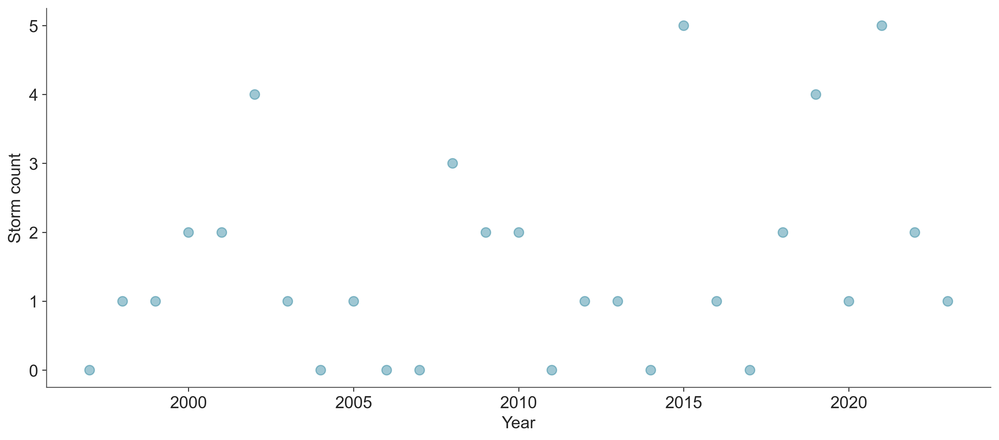

In [26]:
plt.plot(years, disaster_data, "o", markersize=8, alpha=0.4)
plt.ylabel("Storm count")
plt.xlabel("Year");

In [27]:
with pm.Model() as disaster_model:
   # switchpoint = pm.DiscreteUniform("switchpoint", lower=years.min(), upper=years.max())
    switchpoint = pm.DiscreteUniform("switchpoint", lower=2013, upper=2016)
    #switchpoint=2015

    # Priors for pre- and post-switch rates number of disasters
    early_rate = pm.Exponential("early_rate", 1.0)
    late_rate = pm.Exponential("late_rate", 1.0)

    # Allocate appropriate Poisson rates to years before and after current
    rate = pm.math.switch(switchpoint >= years, early_rate, late_rate)

    disasters = pm.Poisson("disasters", rate, observed=disaster_data)
    stormtrace=pm.sample(10000,target_accept=.99)

Multiprocess sampling (4 chains in 4 jobs)
CompoundStep
>Metropolis: [switchpoint]
>NUTS: [early_rate, late_rate]


Output()

Sampling 4 chains for 1_000 tune and 10_000 draw iterations (4_000 + 40_000 draws total) took 6 seconds.


array([<Axes: title={'center': 'early_rate'}>,
       <Axes: title={'center': 'late_rate'}>], dtype=object)

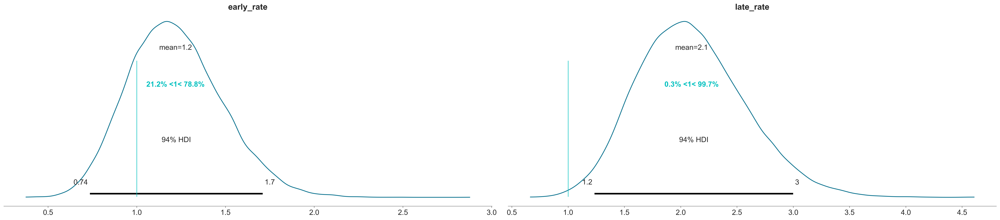

In [28]:
az.plot_posterior(stormtrace.posterior,var_names=["early_rate","late_rate"],ref_val=1.)

/var/folders/l8/1gztm4113nxdtdj6k7cd03b40000gp/T/ipykernel_69529/1252787015.py:24: UserWarning: The figure layout has changed to tight
  plt.tight_layout()


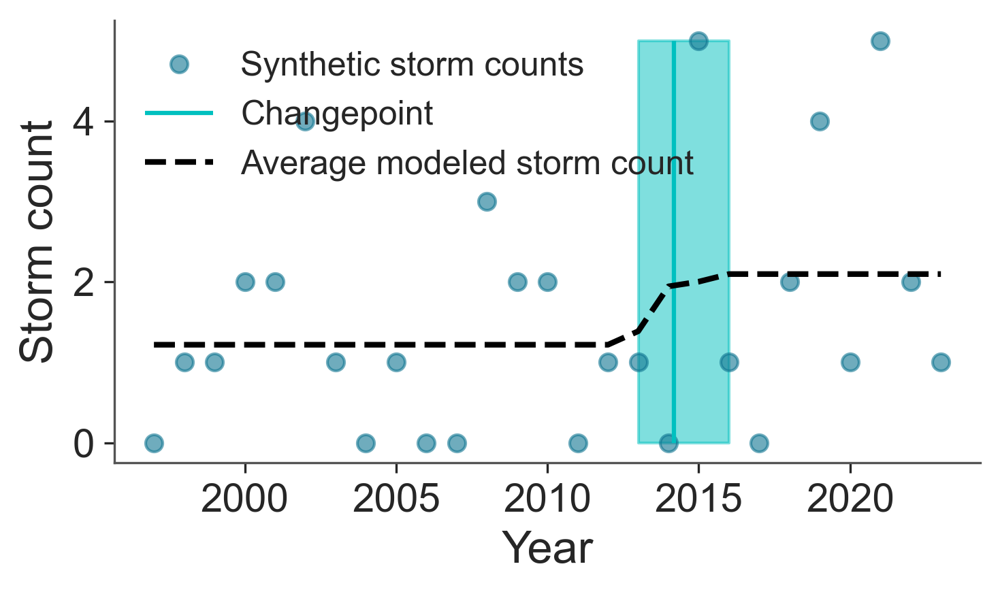

In [45]:
plt.figure(figsize=(5, 3))
plt.plot(years, disaster_data, "o", alpha=0.6,label="Synthetic storm counts",markersize=6)
plt.ylabel("Storm count", fontsize=16)
plt.xlabel("Year", fontsize=16)

trace = stormtrace.posterior.stack(draws=("chain", "draw"))

plt.vlines(trace["switchpoint"].mean(), disaster_data.min(), disaster_data.max(), color="C1",label="Changepoint")
average_disasters = np.zeros_like(disaster_data, dtype="float")
for i, year in enumerate(years):
    idx = year < trace["switchpoint"]
    average_disasters[i] = np.mean(np.where(idx, trace["early_rate"], trace["late_rate"]))

sp_hpd = az.hdi(stormtrace, var_names=["switchpoint"])["switchpoint"].values
plt.fill_betweenx(
    y=[disaster_data.min(), disaster_data.max()],
    x1=sp_hpd[0],
    x2=sp_hpd[1],
    alpha=0.5,
    color="C1",
)
plt.plot(years, average_disasters, "k--", lw=2,label="Average modeled storm count");
plt.legend(fontsize=12)
plt.tight_layout()
plt.savefig("FIGS/stormcount.pdf")